### Setup

In [1]:
# reload ext
%load_ext autoreload
%autoreload 2

import os
# set order of gpus same as PCIE bus order
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
# set 3rd gpu as only visible one
os.environ["CUDA_VISIBLE_DEVICES"] = "3"

In [2]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import pickle
import os
import copy
from training.networks_stylegan3 import Generator
from torchvision.transforms import ToTensor
from glob import glob
from PIL import Image
from tqdm import tqdm
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA 
from torchvision.transforms import Resize, Compose, ToPILImage, ToTensor
from torchvision.utils import make_grid
import pandas as pd
try:
    from IPython.display import HTML, display
    from IPython.display import Image as IImage
except ImportError:
    from IPython.core.display import HTML, display
    from IPython.core.display import Image as IImage

from legacy import load_network_pkl
device = torch.device('cuda', 0)
gpath = "pretrained/stylegan3-r-ffhq-1024x1024.pkl" # pretrained/stylegan3-t-ffhq-1024x1024.pkl
with open(gpath, 'rb') as f:
    G_old = load_network_pkl(f)['G_ema'].to(device)

# new trained, load model
path = "training-runs/SSclong/00019-stylegan3-r-metfaces-gpus4-batch64-gamma2--teacher5.0G/network-snapshot-002016.pkl"

with open(path, 'rb') as f:
    G = load_network_pkl(f)['G_ema'].to(device)

In [10]:
z = torch.from_numpy(np.random.randn(1, 512).astype(np.float32)).to(device)
c = torch.randn(1, G.c_dim, device=device)


def do_once(G, z, c, truncation_psi=1, noise_mode='const'):
    w = G.mapping(z, c, truncation_psi=truncation_psi)
    img = G.synthesis(w, noise_mode=noise_mode)
    return img.cpu(), w

def plot_grid(G, G_old, z_grid, c_grid, outputfile, PSI=0.5, nrow=4):
    img, w = do_once(G, z_grid, c_grid, truncation_psi=PSI)
    
    grid = make_grid(img, nrow=4, normalize=True, value_range=(-1, 1))
    c_old = None if G_old.c_dim == 0 else c_grid
    img_original, w_original = do_once(G_old, z_grid, c_old, truncation_psi=PSI)
    if c_old:
        print("Both are conditional")
    grid_original = make_grid(img_original, nrow=nrow, normalize=True, value_range=(-1, 1))

    # display the grid and grid_original side by side, with the same scale
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax[0].imshow(grid.permute(1, 2, 0).cpu().numpy())
    ax[1].imshow(grid_original.permute(1, 2, 0).cpu().numpy())
    # title subplots
    avg_conditional = torch.mean(c_grid, dim=0).item()
    ax[0].set_title(f'New ψ={PSI} (c_avg={avg_conditional:.3f})')
    ax[1].set_title(f'Original ψ={PSI}')
    # disable axis for both
    ax[0].axis('off')
    ax[1].axis('off')
    plt.tight_layout()
    fig.savefig(outputfile, bbox_inches='tight')
    plt.clf(); plt.cla(); plt.close()
    display(IImage(filename=outputfile)) #display(Image.open(ouputfile))
    return img.cpu(), w.cpu(), img_original.cpu(), w_original.cpu() #, HTML(f'<img src="{ouputfile}">')

w = G.mapping(z, c)
img = G.synthesis(w)
img.shape

torch.Size([1, 3, 1024, 1024])

In [11]:
n_samples = 16
z_grid = torch.randn(n_samples, G.z_dim, device=device)
c_grid_ones = torch.ones(n_samples, G.c_dim, device=device)
c_grid = torch.zeros(n_samples, G.c_dim, device=device)
c_grid_random = torch.randn(n_samples, G.c_dim, device=device)

## Plots comparison

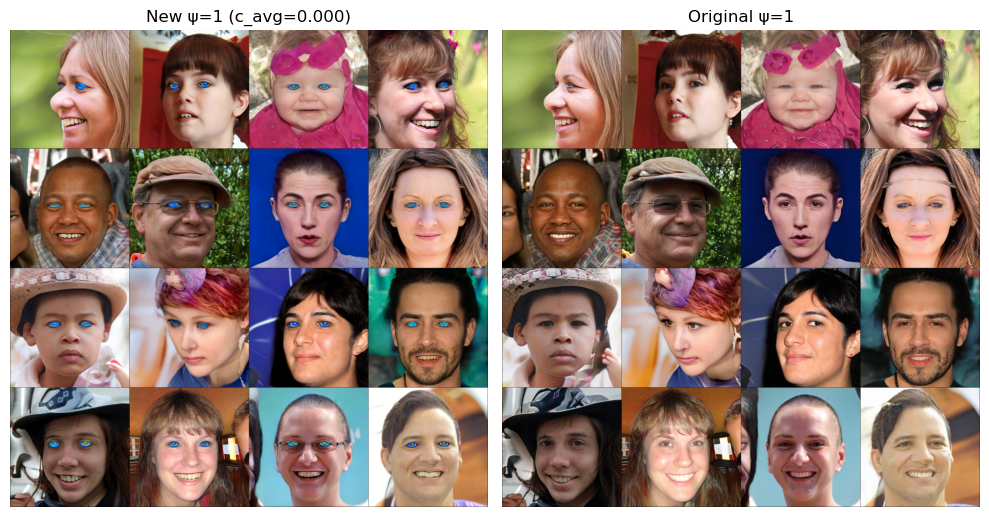

In [12]:
img_zeros, w_zeros, img_original, w_original = plot_grid(G, G_old, z_grid, c_grid, "visualizations/grid_zeros_original_1.png",  PSI=1, nrow=4)

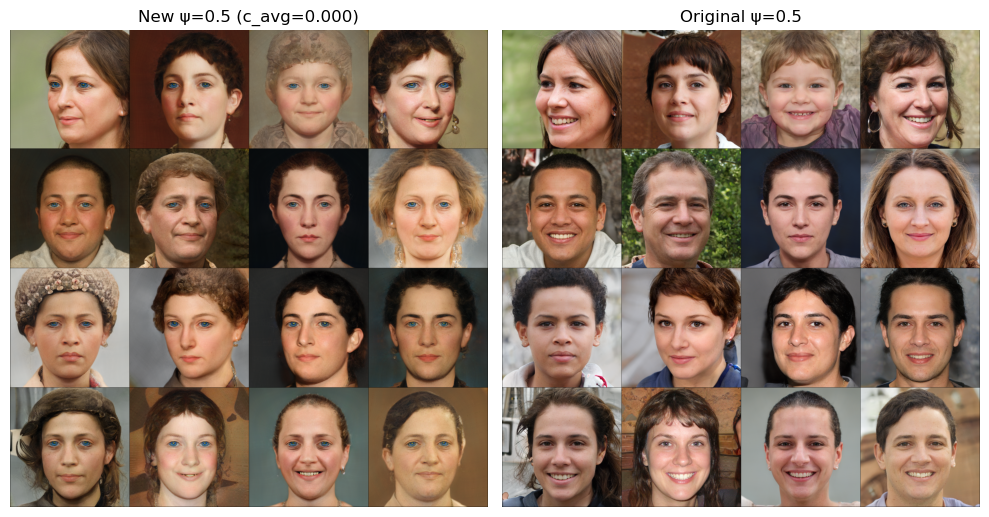

In [13]:
img_zeros5, w_zeros5, img_original5, w_original5 = plot_grid(G, G_old, z_grid, c_grid, "visualizations/grid_zeros5_original5_0.5.png", PSI=0.5, nrow=4)

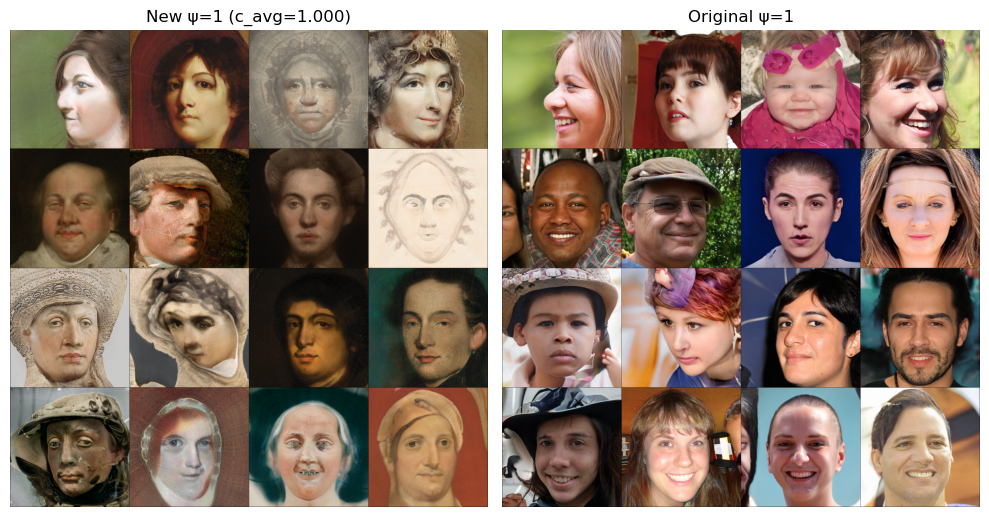

In [14]:
img_ones, w_ones, _, _ = plot_grid(G, G_old, z_grid, c_grid_ones, "visualizations/grid_ones_original_1.png", PSI=1, nrow=4)

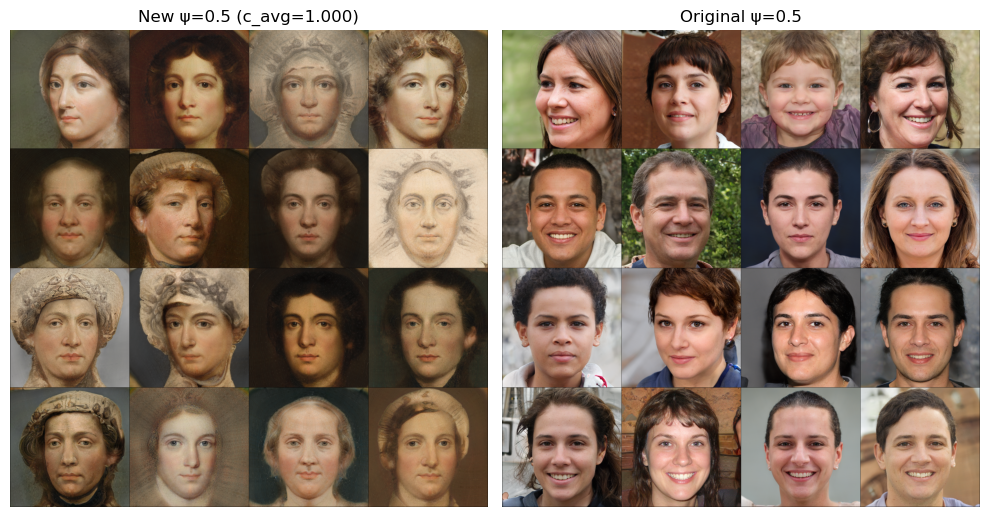

In [15]:
img_ones5, w_ones5, img_original5, w_original5 = plot_grid(G, G_old, z_grid, c_grid_ones, "visualizations/grid_ones5_original5_0.5.png", PSI=0.5, nrow=4)

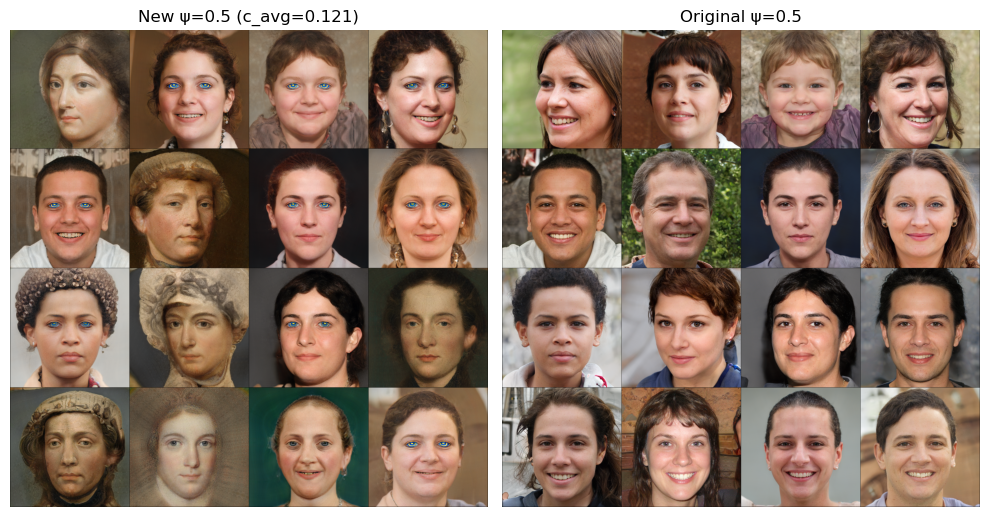

In [16]:
img_rand5, w_rand5, _, _ = plot_grid(G, G_old, z_grid, c_grid_random, "visualizations/grid_rnd5_original5_0.5.png", PSI=0.5, nrow=4)

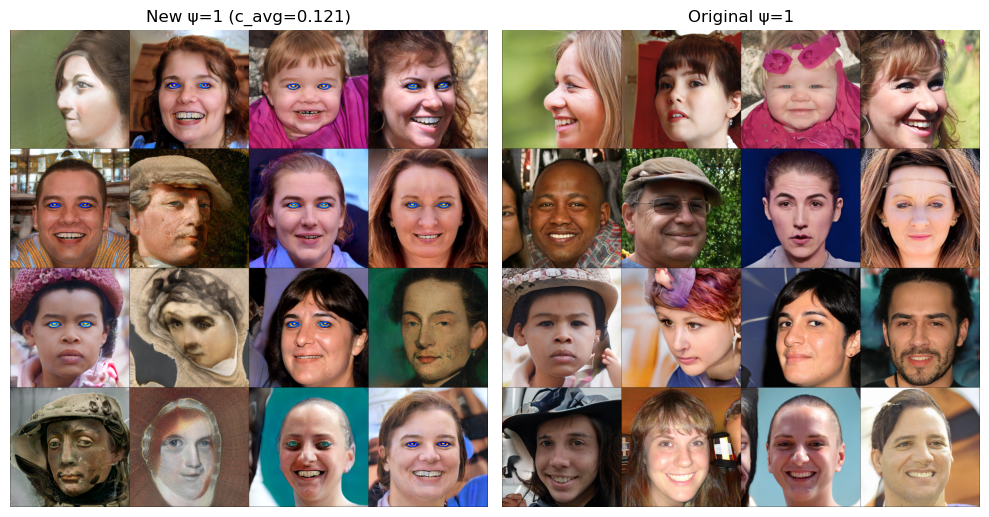

In [17]:
img_rand, w_rand, _, _ = plot_grid(G, G_old, z_grid, c_grid_random, "visualizations/grid_rnd_original_1.png", PSI=1, nrow=4)

## Dimensional reduction setup

In [18]:
def do_tsne(X, n_components=2, learning_rate='auto', n_iter=1000):
    tsne = TSNE(n_components=n_components, learning_rate=learning_rate, n_iter=n_iter).fit_transform(X)
    tx, ty = tsne[:,0], tsne[:,1]
    tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
    ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))
    print(f"TSNE Shape: {tx.shape}, {ty.shape}")
    return tx, ty

def do_pce(imgs_list, target_names, n_components=32):
    img_mat = np.array(imgs_list)
    print("Image Mat Shape:")
    print(img_mat.shape)
    pca = PCA(n_components=n_components)
    targets = np.array(list(range(len(target_names)))).repeat(w_ones5.shape[0])
    pca = pca.fit(img_mat)
    pca_feat = pca.transform(img_mat)
    print("No. of PCA Features:")
    print(pca_feat.shape)   
    return pca, pca_feat, targets

target_names = ['w_ones5', 'w_zeros5', 'w_ones', 'w_zeros', 'w_original', 'w_original5']
imgs_list, vis_imgs = [], []
#lambda function to convert to normalize image

w_all = torch.cat([w_ones5, w_zeros5, w_ones, w_zeros, w_original, w_original5])
imgs_all = torch.cat([img_ones5, img_zeros5, img_ones, img_zeros, img_original, img_original5])

to_pil = ToPILImage()
resizer = Resize((256, 256))

for w, img in zip(w_all, imgs_all):
    w = w.cpu().detach().view(-1).numpy()
    imgs_list.append(w)
    img_cur = to_pil(resizer((img + 1)/2))
    vis_imgs.append(img_cur)
    
pca, pca_feat, targets =  do_pce(imgs_list, target_names, n_components=32)
tx, ty = do_tsne(pca_feat, n_components=2, learning_rate='auto', n_iter=1000)
#pca2, pca_feat2, _ =  do_pce(pca_feat, target_names, n_components=2)
#tx, ty = pca_feat2[:,0], pca_feat2[:,1]

Image Mat Shape:
(96, 8192)
No. of PCA Features:
(96, 32)
TSNE Shape: (96,), (96,)


In [19]:
import warnings
warnings.filterwarnings('ignore')

def visualize_space(tx, ty, images, outfile, max_dim=256, width=4000, height=3000, use_transparent=False):
    full_image = Image.new('RGBA', (width, height))
    # set white background
    if not use_transparent:
        full_image.paste((255, 255, 255, 255), [0, 0, width, height])
    for img, x, y in zip(images, tx, ty):
        assert isinstance(img, Image.Image), f'img must be a PIL Image, got {type(img)}'
        # tile is the img, with alpha changed to 0.8 (80% opacity)
        tile = img.convert('RGBA')
        #tile.putalpha(Image.new('L', tile.size, int(255*0.9)))

        full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile)

    full_image.save(outfile)   
    return display(Image.open(outfile))
    # return html representation that ipynb can use, with local file structure
    #return HTML(f'<img src="{outfile}">')

def visualize_space_as_dots(tx, ty, outfile, targets, target_names, height=512, width=512, dpi=100):
    colors = plt.cm.get_cmap('tab10', len(target_names))
    fig, ax = plt.subplots(figsize=(10, 8)) # (width/dpi, height/dpi), dpi=dpi
    #fig= plt.figure(figsize=(33, 25))
    #ax = fig.add_subplot(111)
    #ax = fig.add_axes([1, 1, 0, 0])
    scatter = ax.scatter(tx, 1 - ty, c=targets, cmap=colors, marker='D')
    
    plt.axis("off")
    legend1 = ax.legend(*scatter.legend_elements(), loc="upper right")

    for i in range(len(target_names)):
        legend1.get_texts()[i].set_text(target_names[i])
    _ = ax.add_artist(legend1)
    # plt.tight_layout()
    # add scatter to fig
    #fig.add_artist(scatter)
    fig.savefig(outfile, bbox_inches='tight', pad_inches=0)
    #Image.frombytes('RGB', fig.canvas.get_width_height(),fig.canvas.tostring_rgb()).save(outfile)
    plt.clf(); plt.cla(); plt.close()
    return display(Image.open(outfile)) #display(IImage(filename=outfile))

## Visualize the space 

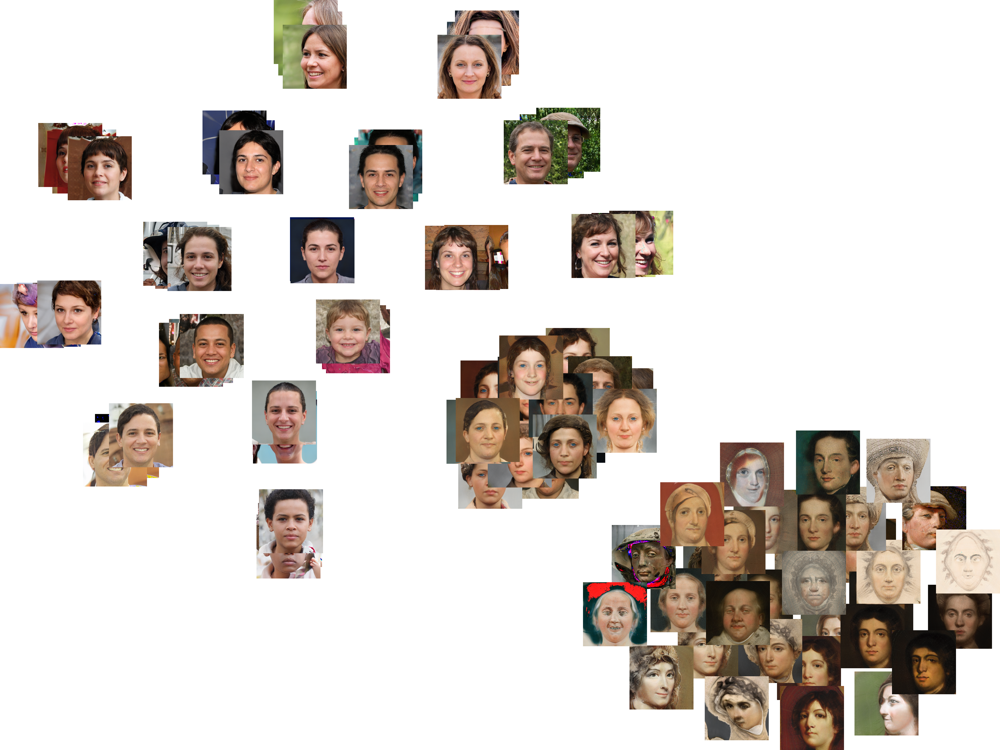

In [20]:
visualize_space(tx, ty, vis_imgs,"visualizations/tSNE-PCA-imgs.png", max_dim=256)

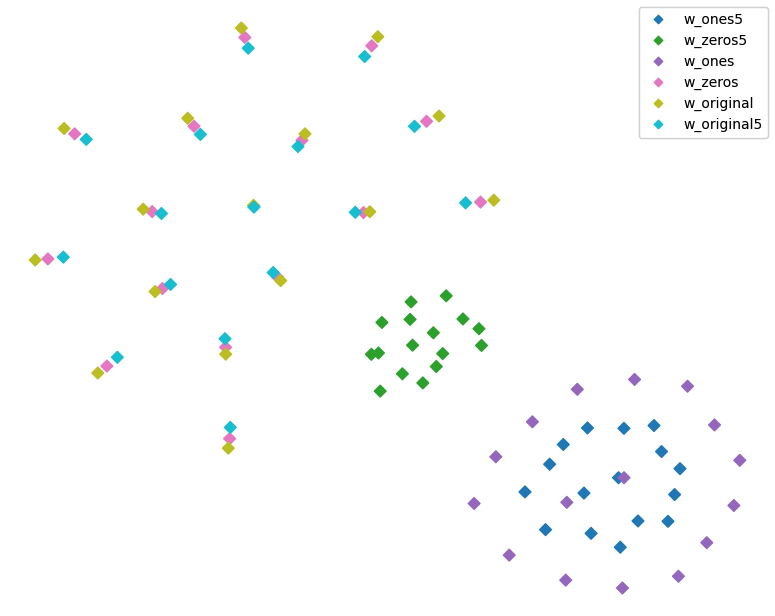

In [21]:
visualize_space_as_dots(tx, ty, "visualizations/tSNE-PCA-imgs_dots.png", targets, target_names)

## Model diff? can we remove the blue eyes

In [22]:
# calculate the difference between the model weights, l2 norm
def model_diff_dict(G, G_old, option=None, device=None):
    assert option in [None, 'expand', 'reduce']
    diff_dict = {}
    if device is None:
        # get the device from the model
        device = next(G.parameters()).device
    for k in G_old.state_dict().keys():
        # check if the dimensions are okay
        if G_old.state_dict()[k].shape == G.state_dict()[k].shape:
            diff_dict[k] = torch.norm(G_old.state_dict()[k] - G.state_dict()[k]).item()
        else:
            if option == 'expand':
                # expand the dimension of the old model
                # new torch.Size([512, 1024]), old torch.Size([512, 512]), expand with zeros the old one
                assert G_old.state_dict()[k].shape[0] == G.state_dict()[k].shape[0] and G_old.state_dict()[k].shape[1] * 2 == G.state_dict()[k].shape[1], f'new {G.state_dict()[k].shape}, old {G_old.state_dict()[k].shape}'
                
                new_torch = torch.zeros(G.state_dict()[k].shape, device=device)
                new_torch[:, :G_old.state_dict()[k].shape[1]] = G_old.state_dict()[k]

                diff_dict[k] = torch.norm(new_torch - G.state_dict()[k]).item()
            elif option == 'reduce':
                # reduce the dimension of the new model, eliminating the extra [:, 512:] dimension
                # new torch.Size([512, 512]), old torch.Size([512, 1024])
                assert G_old.state_dict()[k].shape[0] == G.state_dict()[k].shape[0] and G_old.state_dict()[k].shape[1] *2== G.state_dict()[k].shape[1], f'new {G.state_dict()[k].shape}, old {G_old.state_dict()[k].shape}'

                new_torch = torch.zeros(G_old.state_dict()[k].shape, device=device)
                new_torch[:, :G_old.state_dict()[k].shape[1]] = G.state_dict()[k][:, :G_old.state_dict()[k].shape[1]]
                diff_dict[k] = torch.norm(G_old.state_dict()[k] - new_torch).item()
            else:
                raise ValueError('option must be either None, expand or reduce for now')
    return diff_dict

In [29]:
diff = model_diff_dict(G, G_old, option='expand')
print(f'Number of weights: {len(diff)}')
df = pd.DataFrame(diff.items(), columns=['key', 'value'])
df.to_csv('diff_expand.csv', index=False)
# for k in diff.keys():
#     print(f'{k}: {diff[k]}')
print(f'Total sum:{sum(diff.values()):.2f}')

Number of weights: 114
Total sum:61123.62


In [30]:
df.describe()

,value
count,114.000000
mean,536.172118
std,4801.511236
min,0.000000
25%,0.000000
50%,0.773015
75%,15.202921
max,51129.207031


In [31]:
diff_r = model_diff_dict(G, G_old, option='reduce')
print(f'Number of weights: {len(diff_r)}')
df = pd.DataFrame(diff_r.items(), columns=['key', 'value'])
df.to_csv('diff_reduce.csv', index=False)
# save to file in csv
# for k in diff_r.keys():
#     print(f'{k}: {diff_r[k]}')
print(f'Total sum:{sum(diff_r.values()):.2f}')

Number of weights: 114
Total sum:10174.51


In [32]:
df.describe()

,value
count,114.000000
mean,89.250061
std,449.788293
min,0.000000
25%,0.000000
50%,0.773015
75%,15.202921
max,4689.212891


In [39]:
[i[0] for i in G.synthesis.named_children()]

['input',
 'L0_36_1024',
 'L1_36_1024',
 'L2_52_1024',
 'L3_52_1024',
 'L4_84_1024',
 'L5_148_1024',
 'L6_148_1024',
 'L7_276_645',
 'L8_276_406',
 'L9_532_256',
 'L10_1044_161',
 'L11_1044_102',
 'L12_1044_64',
 'L13_1024_64',
 'L14_1024_3']

In [57]:
[i[0] for i in G.named_children()]

['synthesis', 'mapping']

In [117]:
layers_name_to_replace = [f'synthesis.L{i}' for i in range(0, 14)]
print(layers_name_to_replace)

['synthesis.L0', 'synthesis.L1', 'synthesis.L2', 'synthesis.L3', 'synthesis.L4', 'synthesis.L5', 'synthesis.L6', 'synthesis.L7', 'synthesis.L8', 'synthesis.L9', 'synthesis.L10', 'synthesis.L11', 'synthesis.L12', 'synthesis.L13']


In [33]:
# layers_name_to_replace = [ 'synthesis.L0','synthesis.L1','synthesis.L2', 'synthesis.L3',
#                           'synthesis.L4','synthesis.L5', 'synthesis.L6', 'synthesis.L7',
#                           'synthesis.L13' ,'synthesis.L14']
layers_name_to_replace = [ 'synthesis.L']

Number of weights: 114
Total sum:52076.52
Diff between the old_model and the new_model with the replaced weights 0.0 Previously 9047.103858731221


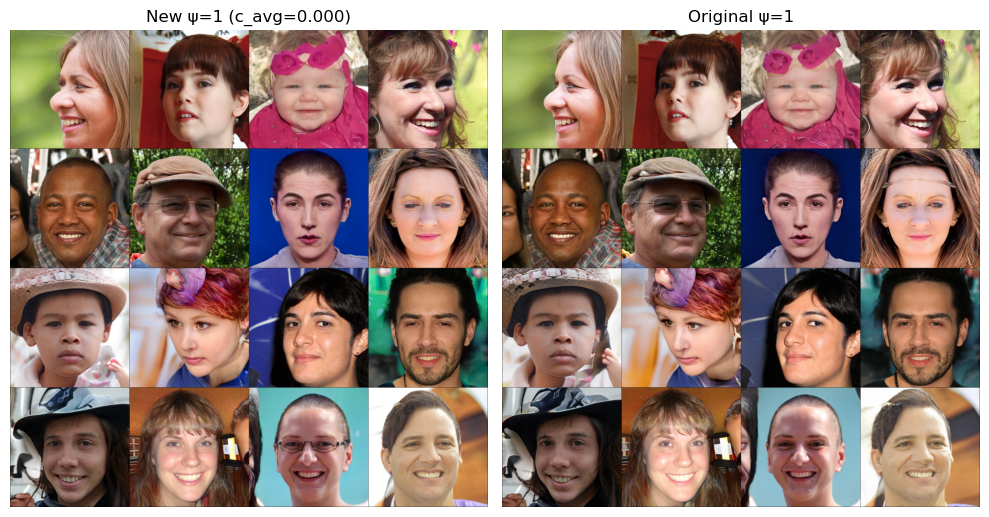

In [34]:
# create a copy of G
# layers_name_to_replace = ["synthesis.L14", "synthesis.L13", "synthesis.L12", "synthesis.L11"]
G_replace = copy.deepcopy(G).to(device)
# replace the weights of G_replace with the weights of G_old, for specific layers
rep_str = []
for k in G_replace.state_dict().keys():
    # check if layers_name_to_replace, some of them are a substring of current layer
    if any([layer_name in k for layer_name in layers_name_to_replace]):
        rep_str.append(f'layer {k} replaced')
        G_replace.state_dict()[k].copy_(G_old.state_dict()[k].clone().detach().to(device))

diff_m = model_diff_dict(G_replace, G_old, option='expand')
print(f'Number of weights: {len(diff_m)}')
print(f'Total sum:{sum(diff_m.values()):.2f}') 
print('Diff between the old_model and the new_model with the replaced weights',
      f'{sum([value for k,value in diff_m.items() if any([layer_name in k for layer_name in layers_name_to_replace])])}',
       'Previously',
      f'{sum([value for k,value in diff.items() if any([layer_name in k for layer_name in layers_name_to_replace])])}')

img_replace, w_replace, _, _ = plot_grid(G_replace, G_old, z_grid, c_grid, "visualizations/grid_replace_original_1.png", PSI=1, nrow=4)